In [1]:
import os
import numpy as np
import torch
import torch.nn as nn
from sklearn.model_selection import train_test_split
from torch.utils.data import Dataset, DataLoader
from torchvision.transforms import v2
from torchvision.models import resnet18
import matplotlib.pyplot as plt
from tqdm import tqdm
import aligner
import recognizer

In [2]:
root = '../dataset'
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


In [3]:
data = {}
faces = []
label_encoder = []
labels = []
for cur_root, cur_dirs, cur_files in os.walk(root):
    if len(cur_files) > 50:
        name = cur_root[11:] # magic number
        label_encoder.append(name)
        data[name] = []
        for i in range(len(cur_files)):
            file = '/'.join((root, name, cur_files[i]))
            data[name].append(file)
            labels.append(label_encoder.index(name))
            faces.append(file)
            if len(data[name]) > 10:
                break

In [4]:
print(len(label_encoder))

12


In [5]:
print(label_encoder)

['Ariel_Sharon', 'Colin_Powell', 'Donald_Rumsfeld', 'George_W_Bush', 'Gerhard_Schroeder', 'Hugo_Chavez', 'Jacques_Chirac', 'Jean_Chretien', 'John_Ashcroft', 'Junichiro_Koizumi', 'Serena_Williams', 'Tony_Blair']


In [ ]:
for i in range(5):
    fig, ax = plt.subplots(nrows=1, ncols=5, figsize=(15, 5))
    for j in range(5):
        VP = data['George_W_Bush']
        idx = np.random.randint(len(VP))
        image = plt.imread(VP[idx])
        ax[j].imshow(image)
        ax[j].set_title('George_W_Bush')
    plt.tight_layout()
    plt.show()

In [7]:
# As you can see, this dataset has already some augmentations, so we may not apply ours

In [8]:
train_faces, val_faces, train_labels, val_labels = train_test_split(faces, labels, test_size=0.3, random_state=42, shuffle=True)
#shuffle=True is needed because otherwise there would be a small amount of different people in train

In [9]:
print(len(train_faces))

92


In [ ]:
aligned_train_data = [(aligner.get_faces(train_faces[i])[0], train_labels[i]) for i in tqdm(range(len(train_faces)))]

In [ ]:
aligned_val_data = [(aligner.get_faces(val_faces[i])[0], val_labels[i]) for i in tqdm(range(len(val_faces)))]

In [12]:
class FacesDataset(Dataset):
    def __init__(self, data, mode):
        super().__init__()
        self.data = data.copy()
        self.mode = mode

        if self.mode not in ['train', 'val', 'test']:
            raise ValueError("mode must be either 'train', 'val' or 'test'")
    
    def __len__(self):
        return len(self.data)
    
    def __getitem__(self, index):
        data_transforms = {
            'train': v2.Compose([
                v2.Resize((250, 250)),
                v2.RandomHorizontalFlip(p=0.5),
                v2.RandomRotation(20),
                v2.RandomChoice([
                    v2.RandomAdjustSharpness(sharpness_factor=2),
                    v2.RandomAdjustSharpness(sharpness_factor=1),
                    v2.RandomAdjustSharpness(sharpness_factor=0)
                ]),
                v2.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
            ]),

            'val': v2.Compose([
                v2.Resize((250, 250)),
                v2.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
            ]),

            'test': v2.Compose([
                v2.Resize((250, 250)),
                v2.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
            ]),
        }

        if self.mode == 'test':
            x = self.data[index]
            x = torch.tensor(x / 255, dtype=torch.float32)
            x = data_transforms[self.mode](x.permute(2, 0, 1))
            return x
        else:
            x, y = self.data[index]
            x = torch.tensor(x / 255, dtype=torch.float32)
            x = data_transforms[self.mode](x.permute(2, 0, 1))
            return x, y

In [13]:
aligned_train_dataset = FacesDataset(aligned_train_data, mode='train')
aligned_val_dataset = FacesDataset(aligned_val_data, mode='val')

In [ ]:
for i in range(5):
    fig, ax = plt.subplots(nrows=1, ncols=5, figsize=(15, 5))
    for j in range(5):
        idx = np.random.randint(len(aligned_train_dataset))
        image, name = aligned_train_dataset[idx]
        ax[j].imshow(image.permute(1, 2, 0))
        ax[j].set_title(label_encoder[name])
    plt.tight_layout()
    plt.show()

In [39]:
model = resnet18(weights='DEFAULT').to(device)
model.fc = nn.Linear(model.fc.in_features, len(label_encoder))
model

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [40]:
criterion = nn.CrossEntropyLoss()

In [41]:
init_lr = 1e-3
optimizer = torch.optim.AdamW(model.parameters(), lr=init_lr)

In [42]:
batch_size = 32
epochs = 50
r = recognizer.Recognizer(model, criterion, optimizer, aligned_train_dataset, aligned_val_dataset, batch_size, epochs, device, lr_step=10, lr_coef=0.5)

In [43]:
layers_to_unfreeze = 30
r.freeze_layers(layers_to_unfreeze)

In [44]:
history = r.train()

Epoch: 1


100%|██████████| 3/3 [00:00<00:00,  3.11it/s]


train_loss - 2.399482, train_acc - 0.206522


100%|██████████| 2/2 [00:00<00:00, 10.91it/s]


val_loss - 3.094077, val_acc - 0.125000
Model saved!
Epoch: 2


100%|██████████| 3/3 [00:00<00:00,  4.15it/s]


train_loss - 1.062315, train_acc - 0.706522


100%|██████████| 2/2 [00:00<00:00,  9.30it/s]


val_loss - 4.785197, val_acc - 0.225000
Epoch: 3


100%|██████████| 3/3 [00:00<00:00,  4.77it/s]


train_loss - 0.609281, train_acc - 0.793478


100%|██████████| 2/2 [00:00<00:00,  9.43it/s]


val_loss - 4.442237, val_acc - 0.375000
Epoch: 4


100%|██████████| 3/3 [00:00<00:00,  4.59it/s]


train_loss - 0.297807, train_acc - 0.945652


100%|██████████| 2/2 [00:00<00:00,  9.77it/s]


val_loss - 3.134464, val_acc - 0.350000
Epoch: 5


100%|██████████| 3/3 [00:00<00:00,  4.58it/s]


train_loss - 0.115996, train_acc - 0.967391


100%|██████████| 2/2 [00:00<00:00,  9.64it/s]


val_loss - 2.631458, val_acc - 0.425000
Model saved!
Epoch: 6


100%|██████████| 3/3 [00:00<00:00,  4.36it/s]


train_loss - 0.066490, train_acc - 0.989130


100%|██████████| 2/2 [00:00<00:00,  9.46it/s]


val_loss - 2.491550, val_acc - 0.450000
Model saved!
Epoch: 7


100%|██████████| 3/3 [00:00<00:00,  4.84it/s]


train_loss - 0.057054, train_acc - 1.000000


100%|██████████| 2/2 [00:00<00:00,  9.54it/s]


val_loss - 2.109014, val_acc - 0.450000
Model saved!
Epoch: 8


100%|██████████| 3/3 [00:00<00:00,  4.17it/s]


train_loss - 0.054665, train_acc - 0.978261


100%|██████████| 2/2 [00:00<00:00, 10.33it/s]


val_loss - 1.711140, val_acc - 0.600000
Model saved!
Epoch: 9


100%|██████████| 3/3 [00:00<00:00,  4.06it/s]


train_loss - 0.036057, train_acc - 0.989130


100%|██████████| 2/2 [00:00<00:00, 10.21it/s]


val_loss - 1.642242, val_acc - 0.575000
Epoch: 10


100%|██████████| 3/3 [00:00<00:00,  5.49it/s]


train_loss - 0.039964, train_acc - 0.989130


100%|██████████| 2/2 [00:00<00:00, 10.69it/s]


val_loss - 1.927667, val_acc - 0.550000
Decreasing learning rate: 0.001000 -> 0.000500
Epoch: 11


100%|██████████| 3/3 [00:00<00:00,  5.53it/s]


train_loss - 0.069603, train_acc - 0.989130


100%|██████████| 2/2 [00:00<00:00, 10.07it/s]


val_loss - 1.598504, val_acc - 0.600000
Model saved!
Epoch: 12


100%|██████████| 3/3 [00:00<00:00,  4.20it/s]


train_loss - 0.014833, train_acc - 1.000000


100%|██████████| 2/2 [00:00<00:00,  9.47it/s]


val_loss - 1.320606, val_acc - 0.625000
Model saved!
Epoch: 13


100%|██████████| 3/3 [00:00<00:00,  4.38it/s]


train_loss - 0.025557, train_acc - 1.000000


100%|██████████| 2/2 [00:00<00:00,  9.38it/s]


val_loss - 1.048974, val_acc - 0.675000
Model saved!
Epoch: 14


100%|██████████| 3/3 [00:00<00:00,  4.05it/s]


train_loss - 0.025923, train_acc - 0.989130


100%|██████████| 2/2 [00:00<00:00,  9.93it/s]


val_loss - 0.815114, val_acc - 0.700000
Model saved!
Epoch: 15


100%|██████████| 3/3 [00:00<00:00,  3.69it/s]


train_loss - 0.012520, train_acc - 1.000000


100%|██████████| 2/2 [00:00<00:00, 10.60it/s]


val_loss - 0.687880, val_acc - 0.775000
Model saved!
Epoch: 16


100%|██████████| 3/3 [00:00<00:00,  4.10it/s]


train_loss - 0.014232, train_acc - 1.000000


100%|██████████| 2/2 [00:00<00:00,  9.25it/s]


val_loss - 0.618703, val_acc - 0.775000
Model saved!
Epoch: 17


100%|██████████| 3/3 [00:00<00:00,  3.81it/s]


train_loss - 0.004869, train_acc - 1.000000


100%|██████████| 2/2 [00:00<00:00, 10.86it/s]


val_loss - 0.595397, val_acc - 0.750000
Epoch: 18


100%|██████████| 3/3 [00:00<00:00,  5.78it/s]


train_loss - 0.009524, train_acc - 1.000000


100%|██████████| 2/2 [00:00<00:00, 10.85it/s]


val_loss - 0.575834, val_acc - 0.750000
Epoch: 19


100%|██████████| 3/3 [00:00<00:00,  5.76it/s]


train_loss - 0.006837, train_acc - 1.000000


100%|██████████| 2/2 [00:00<00:00, 10.91it/s]


val_loss - 0.569918, val_acc - 0.750000
Epoch: 20


100%|██████████| 3/3 [00:00<00:00,  5.66it/s]


train_loss - 0.007156, train_acc - 1.000000


100%|██████████| 2/2 [00:00<00:00, 10.20it/s]


val_loss - 0.554624, val_acc - 0.775000
Model saved!
Decreasing learning rate: 0.000500 -> 0.000250
Epoch: 21


100%|██████████| 3/3 [00:00<00:00,  4.38it/s]


train_loss - 0.005743, train_acc - 1.000000


100%|██████████| 2/2 [00:00<00:00,  9.37it/s]


val_loss - 0.549593, val_acc - 0.800000
Model saved!
Epoch: 22


100%|██████████| 3/3 [00:00<00:00,  3.94it/s]


train_loss - 0.005532, train_acc - 1.000000


100%|██████████| 2/2 [00:00<00:00, 10.55it/s]


val_loss - 0.544045, val_acc - 0.800000
Model saved!
Epoch: 23


100%|██████████| 3/3 [00:00<00:00,  4.08it/s]


train_loss - 0.004339, train_acc - 1.000000


100%|██████████| 2/2 [00:00<00:00,  9.34it/s]


val_loss - 0.541313, val_acc - 0.825000
Model saved!
Epoch: 24


100%|██████████| 3/3 [00:00<00:00,  3.70it/s]


train_loss - 0.004629, train_acc - 1.000000


100%|██████████| 2/2 [00:00<00:00, 10.93it/s]


val_loss - 0.538089, val_acc - 0.825000
Model saved!
Epoch: 25


100%|██████████| 3/3 [00:00<00:00,  3.99it/s]


train_loss - 0.004385, train_acc - 1.000000


100%|██████████| 2/2 [00:00<00:00, 10.54it/s]


val_loss - 0.541669, val_acc - 0.800000
Epoch: 26


100%|██████████| 3/3 [00:00<00:00,  5.46it/s]


train_loss - 0.002700, train_acc - 1.000000


100%|██████████| 2/2 [00:00<00:00, 10.44it/s]


val_loss - 0.533230, val_acc - 0.825000
Model saved!
Epoch: 27


100%|██████████| 3/3 [00:00<00:00,  4.77it/s]


train_loss - 0.002627, train_acc - 1.000000


100%|██████████| 2/2 [00:00<00:00,  9.15it/s]


val_loss - 0.526770, val_acc - 0.825000
Model saved!
Epoch: 28


100%|██████████| 3/3 [00:00<00:00,  3.83it/s]


train_loss - 0.007485, train_acc - 1.000000


100%|██████████| 2/2 [00:00<00:00,  9.07it/s]


val_loss - 0.528642, val_acc - 0.825000
Epoch: 29


100%|██████████| 3/3 [00:00<00:00,  4.56it/s]


train_loss - 0.002360, train_acc - 1.000000


100%|██████████| 2/2 [00:00<00:00,  9.03it/s]


val_loss - 0.528880, val_acc - 0.825000
Epoch: 30


100%|██████████| 3/3 [00:00<00:00,  4.44it/s]


train_loss - 0.002310, train_acc - 1.000000


100%|██████████| 2/2 [00:00<00:00,  8.50it/s]


val_loss - 0.528764, val_acc - 0.825000
Decreasing learning rate: 0.000250 -> 0.000125
Epoch: 31


100%|██████████| 3/3 [00:00<00:00,  4.42it/s]


train_loss - 0.001957, train_acc - 1.000000


100%|██████████| 2/2 [00:00<00:00,  9.63it/s]


val_loss - 0.527805, val_acc - 0.825000
Epoch: 32


100%|██████████| 3/3 [00:00<00:00,  4.82it/s]


train_loss - 0.004550, train_acc - 1.000000


100%|██████████| 2/2 [00:00<00:00,  9.46it/s]


val_loss - 0.535759, val_acc - 0.825000
Epoch: 33


100%|██████████| 3/3 [00:00<00:00,  4.62it/s]


train_loss - 0.002165, train_acc - 1.000000


100%|██████████| 2/2 [00:00<00:00,  9.55it/s]


val_loss - 0.533300, val_acc - 0.825000
Epoch: 34


100%|██████████| 3/3 [00:00<00:00,  4.70it/s]


train_loss - 0.003451, train_acc - 1.000000


100%|██████████| 2/2 [00:00<00:00,  8.44it/s]


val_loss - 0.541652, val_acc - 0.825000
Epoch: 35


100%|██████████| 3/3 [00:00<00:00,  4.79it/s]


train_loss - 0.005756, train_acc - 1.000000


100%|██████████| 2/2 [00:00<00:00,  9.36it/s]


val_loss - 0.537674, val_acc - 0.825000
Epoch: 36


100%|██████████| 3/3 [00:00<00:00,  4.62it/s]


train_loss - 0.001865, train_acc - 1.000000


100%|██████████| 2/2 [00:00<00:00,  9.67it/s]


val_loss - 0.534207, val_acc - 0.825000
Epoch: 37


100%|██████████| 3/3 [00:00<00:00,  4.97it/s]


train_loss - 0.001871, train_acc - 1.000000


100%|██████████| 2/2 [00:00<00:00,  9.51it/s]


val_loss - 0.536540, val_acc - 0.825000
Epoch: 38


100%|██████████| 3/3 [00:00<00:00,  4.57it/s]


train_loss - 0.002242, train_acc - 1.000000


100%|██████████| 2/2 [00:00<00:00,  9.81it/s]


val_loss - 0.537169, val_acc - 0.825000
Epoch: 39


100%|██████████| 3/3 [00:00<00:00,  4.94it/s]


train_loss - 0.002503, train_acc - 1.000000


100%|██████████| 2/2 [00:00<00:00, 10.02it/s]


val_loss - 0.535981, val_acc - 0.825000
Epoch: 40


100%|██████████| 3/3 [00:00<00:00,  4.90it/s]


train_loss - 0.001930, train_acc - 1.000000


100%|██████████| 2/2 [00:00<00:00,  7.93it/s]


val_loss - 0.528651, val_acc - 0.825000
Decreasing learning rate: 0.000125 -> 0.000063
Epoch: 41


100%|██████████| 3/3 [00:00<00:00,  4.82it/s]


train_loss - 0.002245, train_acc - 1.000000


100%|██████████| 2/2 [00:00<00:00,  9.74it/s]


val_loss - 0.525043, val_acc - 0.825000
Model saved!
Epoch: 42


100%|██████████| 3/3 [00:00<00:00,  3.95it/s]


train_loss - 0.001559, train_acc - 1.000000


100%|██████████| 2/2 [00:00<00:00, 10.39it/s]


val_loss - 0.522917, val_acc - 0.825000
Model saved!
Epoch: 43


100%|██████████| 3/3 [00:00<00:00,  4.29it/s]


train_loss - 0.006059, train_acc - 1.000000


100%|██████████| 2/2 [00:00<00:00,  9.64it/s]


val_loss - 0.528628, val_acc - 0.825000
Epoch: 44


100%|██████████| 3/3 [00:00<00:00,  4.86it/s]


train_loss - 0.002663, train_acc - 1.000000


100%|██████████| 2/2 [00:00<00:00,  9.56it/s]


val_loss - 0.532476, val_acc - 0.825000
Epoch: 45


100%|██████████| 3/3 [00:00<00:00,  4.92it/s]


train_loss - 0.001521, train_acc - 1.000000


100%|██████████| 2/2 [00:00<00:00,  9.77it/s]


val_loss - 0.534479, val_acc - 0.825000
Epoch: 46


100%|██████████| 3/3 [00:00<00:00,  4.67it/s]


train_loss - 0.001825, train_acc - 1.000000


100%|██████████| 2/2 [00:00<00:00,  9.87it/s]


val_loss - 0.529161, val_acc - 0.825000
Epoch: 47


100%|██████████| 3/3 [00:00<00:00,  5.10it/s]


train_loss - 0.001313, train_acc - 1.000000


100%|██████████| 2/2 [00:00<00:00,  9.93it/s]


val_loss - 0.525867, val_acc - 0.825000
Epoch: 48


100%|██████████| 3/3 [00:00<00:00,  5.06it/s]


train_loss - 0.001970, train_acc - 1.000000


100%|██████████| 2/2 [00:00<00:00, 10.08it/s]


val_loss - 0.528059, val_acc - 0.825000
Epoch: 49


100%|██████████| 3/3 [00:00<00:00,  5.25it/s]


train_loss - 0.003480, train_acc - 1.000000


100%|██████████| 2/2 [00:00<00:00,  9.78it/s]


val_loss - 0.526107, val_acc - 0.825000
Epoch: 50


100%|██████████| 3/3 [00:00<00:00,  5.62it/s]


train_loss - 0.001065, train_acc - 1.000000


100%|██████████| 2/2 [00:00<00:00,  9.41it/s]

val_loss - 0.523253, val_acc - 0.825000
Decreasing learning rate: 0.000063 -> 0.000031
Max score: 0.825000, Min loss: 0.522917, Epoch: 42


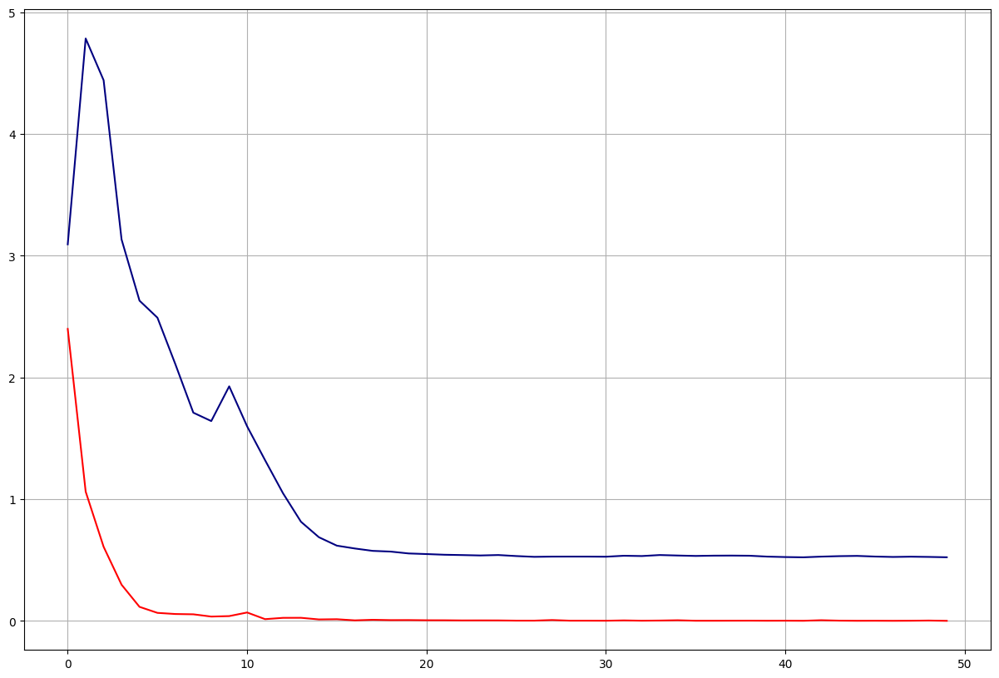

In [45]:
plt.figure(figsize=(15, 10))
plt.grid()
plt.plot(history['train_loss'], color='red')
plt.plot(history['val_loss'], color='navy')
plt.show()

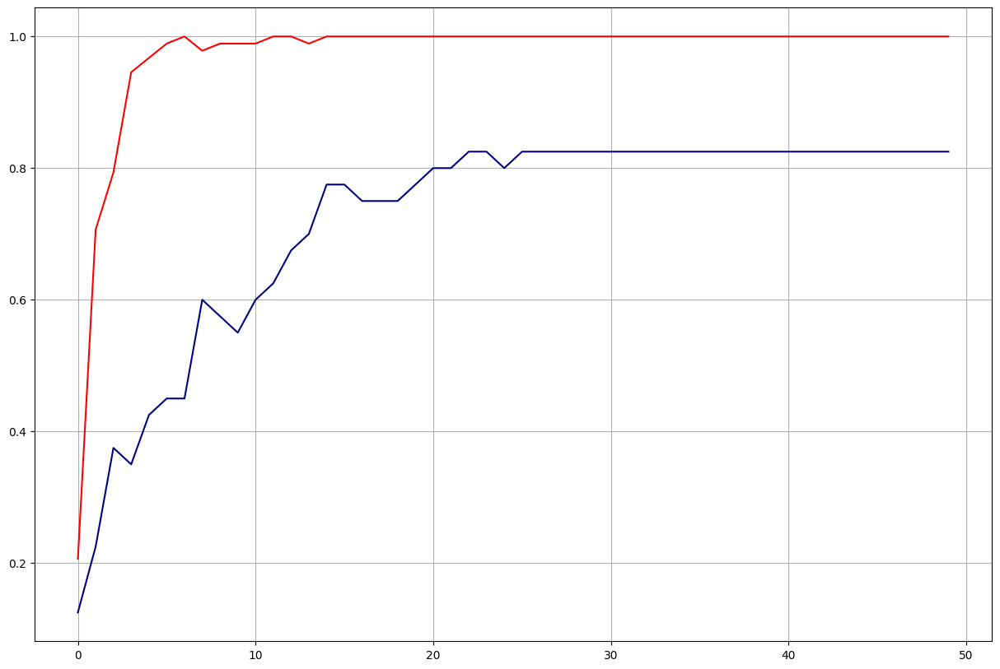

In [46]:
plt.figure(figsize=(15, 10))
plt.grid()
plt.plot(history['train_acc'], color='red')
plt.plot(history['val_acc'], color='navy')
plt.show()

In [38]:
root = '../test'
test_faces = []
for cur_root, cur_dirs, cur_files in os.walk(root):
    for i in range(len(cur_files)):
        file = '/'.join((root, cur_files[i]))
        test_faces.append(file)

In [24]:
print(len(test_faces))

101


In [ ]:
for i in range(5):
    fig, ax = plt.subplots(nrows=1, ncols=5, figsize=(15, 5))
    for j in range(5):
        idx = np.random.randint(len(test_faces))
        image = plt.imread(test_faces[idx])
        ax[j].imshow(image)
    plt.tight_layout()
    plt.show()

In [ ]:
aligned_test_data = [aligner.get_faces(test_faces[i])[0] for i in tqdm(range(len(test_faces)))]

In [27]:
aligned_test_dataset = FacesDataset(aligned_test_data, mode='test')

In [28]:
test_loader = DataLoader(aligned_test_dataset, batch_size=1, shuffle=False)

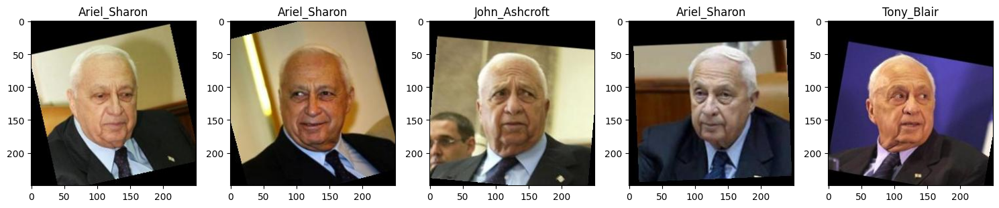

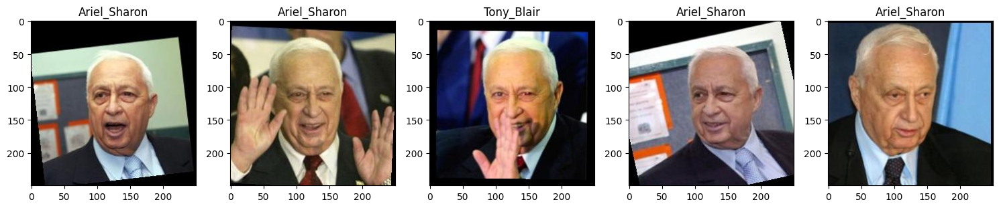

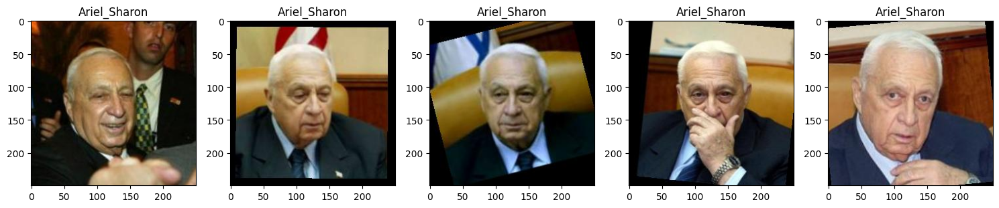

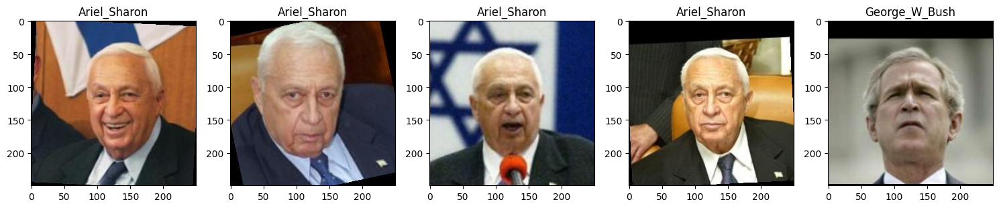

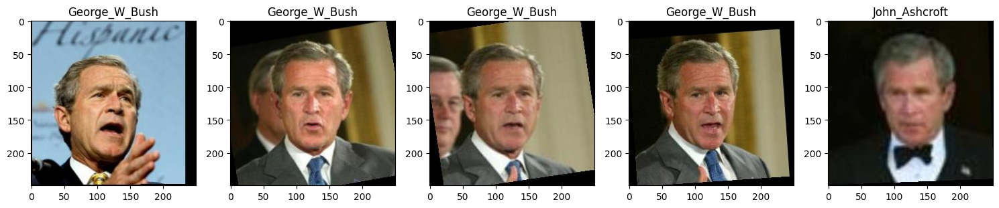

...

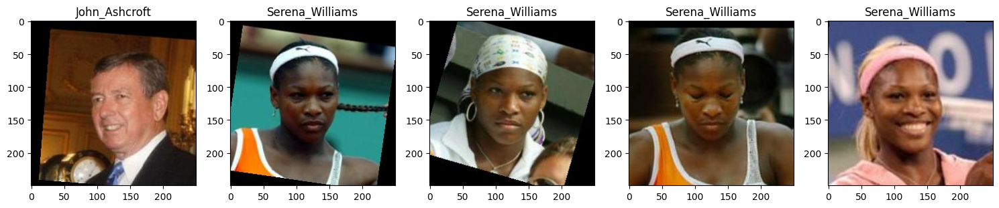

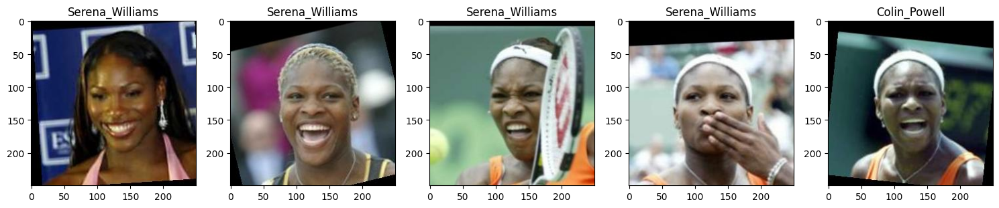

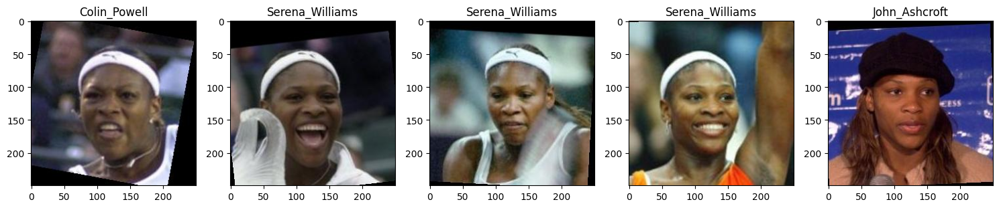

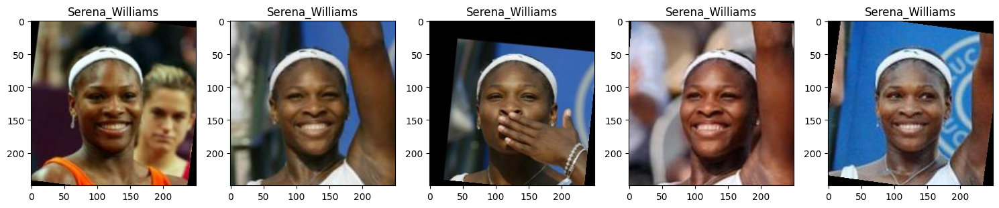

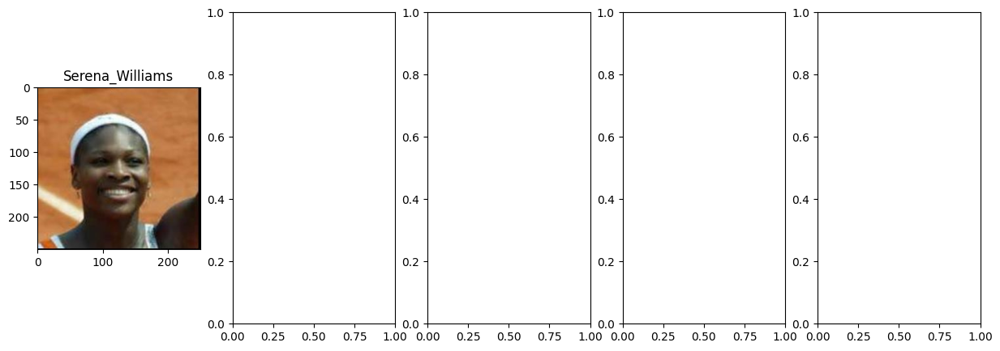

In [47]:
i = 0
fig, ax = plt.subplots(nrows=1, ncols=5, figsize=(15, 5))
for inputs in test_loader:
    inputs = torch.FloatTensor(inputs).to(device)
    preds = r.predict_one_sample(inputs)
    predicted = np.argmax(preds)
    image = plt.imread(test_faces[i])
    ax[i % 5].imshow(image)
    ax[i % 5].set_title(label_encoder[predicted])
    i += 1
    if i % 5 == 0:
        plt.tight_layout()
        plt.show()
        fig, ax = plt.subplots(nrows=1, ncols=5, figsize=(15, 5))